## <center> Wavelength Selection Plots: Boruta and Genetic Algorithm </center>

In [1]:
# Load packages 
import os 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# set the working directory 
os.chdir('C:\\Users\\abc\\OneDrive - UGent\\Documenten\\Derick Malavi_PhD Docs_UGent\\Manuscript 4_Coffee\\Instant_Coffee\\Wavelength_Selection')

In [5]:
# Read_data
instant_raw = pd.read_csv('instant_coffee_raw.csv')
instant_msc_sg_1d = pd.read_csv('coffee_instant_msc_sg_1d.csv')
instant_msc_sg_2d = pd.read_csv('coffee_instant_msc_sg_2d.csv')
instant_snv_sg_1d = pd.read_csv('coffee_instant_snv_sg_1d.csv')
instant_snv_sg_2d = pd.read_csv('coffee_instant_snv_sg_2d.csv')

In [7]:
# Check the shape of the data
print(instant_raw.shape)
print(instant_msc_sg_1d.shape)
print(instant_msc_sg_2d.shape)
print(instant_snv_sg_1d.shape)
print(instant_snv_sg_2d.shape)

(1476, 229)
(1476, 229)
(1476, 229)
(1476, 229)
(1476, 229)


In [9]:
# Check the first few rows 
instant_raw.head(5)

,sample_name,binary_class,three_class,cal_val,perc_adulter,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Arabica_10,pure_arabica,pure_arabica,1,0,0.530853,0.533619,0.561054,0.582093,0.596901,...,0.540360,0.536110,0.532238,0.528059,0.525007,0.521218,0.516975,0.511108,0.504414,0.496085
1,Arabica_10,pure_arabica,pure_arabica,1,0,0.533290,0.535996,0.563077,0.583506,0.597973,...,0.539968,0.535841,0.532169,0.528426,0.525502,0.522217,0.517889,0.511993,0.505306,0.497512
2,Arabica_10,pure_arabica,pure_arabica,1,0,0.531486,0.534291,0.561071,0.581973,0.596549,...,0.545723,0.541324,0.537376,0.532705,0.529344,0.525174,0.520571,0.514255,0.507121,0.499195
3,Arabica_11,pure_arabica,pure_arabica,1,0,0.563388,0.566406,0.596824,0.619869,0.635869,...,0.541186,0.537560,0.534226,0.530944,0.528720,0.525882,0.521746,0.516036,0.510318,0.502815
4,Arabica_11,pure_arabica,pure_arabica,1,0,0.560974,0.563901,0.593892,0.617615,0.633946,...,0.540318,0.536781,0.533500,0.530279,0.527773,0.524809,0.520953,0.515072,0.509542,0.502504


In [11]:
instant_msc_sg_2d.head(5)

,sample_name,binary_class,three_class,cal_val,perc_adulter,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Arabica_10,pure_arabica,pure_arabica,1,0,-0.001552,-0.001552,-0.001552,-0.001552,-0.001552,...,0.000132,-1.033670e-07,-0.000131,-0.000262,-0.000262,-0.000262,-0.000262,-0.000262,-0.000262,-0.000262
1,Arabica_10,pure_arabica,pure_arabica,1,0,-0.001511,-0.001511,-0.001511,-0.001511,-0.001511,...,0.000197,4.488910e-05,-0.000110,-0.000250,-0.000250,-0.000250,-0.000250,-0.000250,-0.000250,-0.000250
2,Arabica_10,pure_arabica,pure_arabica,1,0,-0.001539,-0.001539,-0.001539,-0.001539,-0.001539,...,0.000071,-4.759910e-05,-0.000168,-0.000277,-0.000277,-0.000277,-0.000277,-0.000277,-0.000277,-0.000277
3,Arabica_11,pure_arabica,pure_arabica,1,0,-0.001711,-0.001711,-0.001711,-0.001711,-0.001711,...,0.000181,3.119190e-05,-0.000106,-0.000236,-0.000236,-0.000236,-0.000236,-0.000236,-0.000236,-0.000236
4,Arabica_11,pure_arabica,pure_arabica,1,0,-0.001729,-0.001729,-0.001729,-0.001729,-0.001729,...,0.000183,2.837230e-05,-0.000109,-0.000232,-0.000232,-0.000232,-0.000232,-0.000232,-0.000232,-0.000232


In [13]:
# Select the X columns
X_raw = instant_raw.iloc[:,5:230]
X_msc_sg_1d = instant_msc_sg_1d.iloc[:,5:230]
X_msc_sg_2d = instant_msc_sg_2d.iloc[:,5:230]
X_snv_sg_1d = instant_snv_sg_1d.iloc[:,5:230]
X_snv_sg_2d = instant_snv_sg_2d.iloc[:,5:230]

In [213]:
X_raw.head(2)

,935.609985,939.059998,942.52002,945.97998,949.429993,952.890015,956.349976,959.809998,963.27002,966.72998,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,0.347876,0.349376,0.363904,0.375547,0.384829,0.392920,0.398859,0.403592,0.408170,0.412234,...,0.520932,0.512153,0.502902,0.492153,0.481531,0.470791,0.460815,0.450851,0.441252,0.430884
1,0.332850,0.334093,0.346032,0.356395,0.364701,0.372712,0.378541,0.383322,0.387886,0.391924,...,0.529074,0.519696,0.509692,0.497895,0.486415,0.474300,0.463489,0.452816,0.442621,0.432088


### Boruta Selected Wavelengths

#### Raw Spectra

In [15]:
# Original list of wavelength strings
selected_wavelengths = [
    "X935.609985", "X939.059998", "X949.429993", "X952.890015", "X1130.01001",
    "X1133.5", "X1136.98999", "X1140.469971", "X1143.959961", "X1147.449951",
    "X1150.939941", "X1154.430054", "X1157.930054", "X1269.949951", "X1273.459961",
    "X1276.969971", "X1280.47998", "X1283.98999", "X1287.51001", "X1291.02002",
    "X1294.530029", "X1298.050049", "X1301.560059", "X1305.079956", "X1308.589966",
    "X1312.109985", "X1315.619995", "X1319.140015", "X1322.660034", "X1326.180054",
    "X1329.699951", "X1333.219971", "X1336.73999", "X1340.26001", "X1343.780029",
    "X1347.300049", "X1350.819946", "X1354.349976", "X1357.869995", "X1439.069946",
    "X1442.599976", "X1446.140015", "X1449.680054", "X1453.219971", "X1456.76001",
    "X1460.300049", "X1463.839966", "X1467.380005", "X1470.920044", "X1474.459961",
    "X1478.01001", "X1481.550049", "X1485.089966", "X1488.640015", "X1492.180054",
    "X1495.72998", "X1570.310059", "X1580.98999", "X1663", "X1666.569946",
    "X1670.140015", "X1673.719971", "X1677.290039", "X1680.869995", "X1684.439941",
    "X1688.02002", "X1691.589966", "X1695.170044", "X1698.75", "X1702.329956"
]

# Convert to numeric by removing 'X' and changing type
selected_wavelengths_raw = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_raw)

[935.609985, 939.059998, 949.429993, 952.890015, 1130.01001, 1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951, 1150.939941, 1154.430054, 1157.930054, 1269.949951, 1273.459961, 1276.969971, 1280.47998, 1283.98999, 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1301.560059, 1305.079956, 1308.589966, 1312.109985, 1315.619995, 1319.140015, 1322.660034, 1326.180054, 1329.699951, 1333.219971, 1336.73999, 1340.26001, 1343.780029, 1347.300049, 1350.819946, 1354.349976, 1357.869995, 1439.069946, 1442.599976, 1446.140015, 1449.680054, 1453.219971, 1456.76001, 1460.300049, 1463.839966, 1467.380005, 1470.920044, 1474.459961, 1478.01001, 1481.550049, 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1570.310059, 1580.98999, 1663.0, 1666.569946, 1670.140015, 1673.719971, 1677.290039, 1680.869995, 1684.439941, 1688.02002, 1691.589966, 1695.170044, 1698.75, 1702.329956]


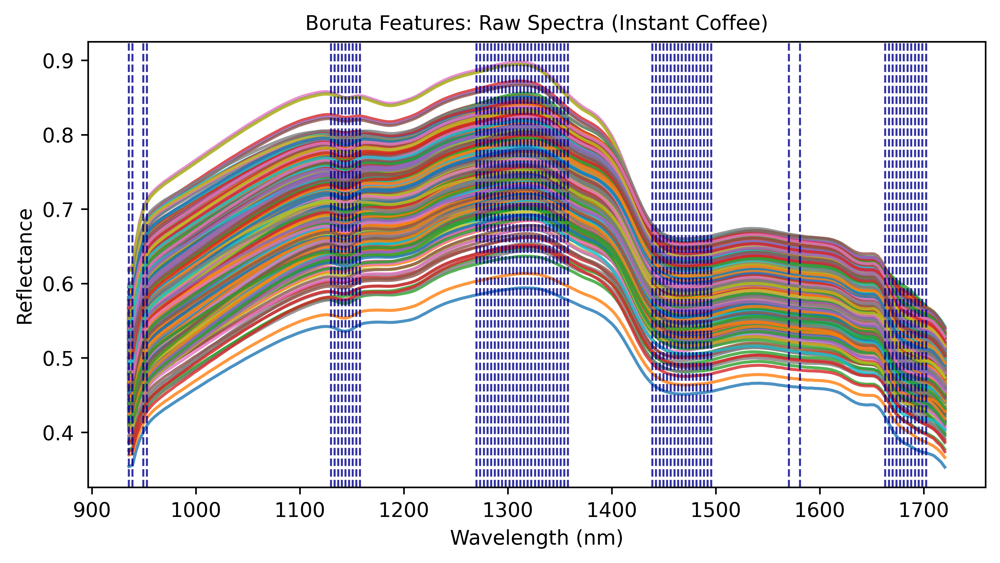

In [31]:
# Get the wavelengths from the column names
wavelengths = X_raw.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_raw  

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_raw.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: Raw Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Reflectance', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_Raw_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+1st Derivative

In [33]:
selected_wavelengths = [
    "X959.809998", "X1161.420044", "X1168.400024", "X1171.900024", "X1182.380005",
    "X1185.880005", "X1189.369995", "X1192.869995", "X1196.369995", "X1199.869995",
    "X1333.219971", "X1336.73999", "X1340.26001", "X1343.780029", "X1347.300049",
    "X1350.819946", "X1354.349976", "X1357.869995", "X1361.390015", "X1364.920044",
    "X1368.439941", "X1371.969971", "X1375.5", "X1379.02002", "X1382.550049",
    "X1431.98999", "X1435.530029", "X1602.349976", "X1605.920044", "X1609.47998",
    "X1613.040039", "X1616.609985", "X1620.170044", "X1623.73999", "X1627.310059",
    "X1630.869995", "X1634.439941", "X1638.01001", "X1641.579956", "X1645.150024",
    "X1648.709961", "X1652.290039", "X1655.859985", "X1659.430054", "X1663",
    "X1666.569946", "X1670.140015", "X1673.719971", "X1677.290039"
]

# Convert to numeric by removing 'X' and changing type
selected_wavelengths_msc_sg_1d = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_msc_sg_1d)

[959.809998, 1161.420044, 1168.400024, 1171.900024, 1182.380005, 1185.880005, 1189.369995, 1192.869995, 1196.369995, 1199.869995, 1333.219971, 1336.73999, 1340.26001, 1343.780029, 1347.300049, 1350.819946, 1354.349976, 1357.869995, 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5, 1379.02002, 1382.550049, 1431.98999, 1435.530029, 1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1663.0, 1666.569946, 1670.140015, 1673.719971, 1677.290039]


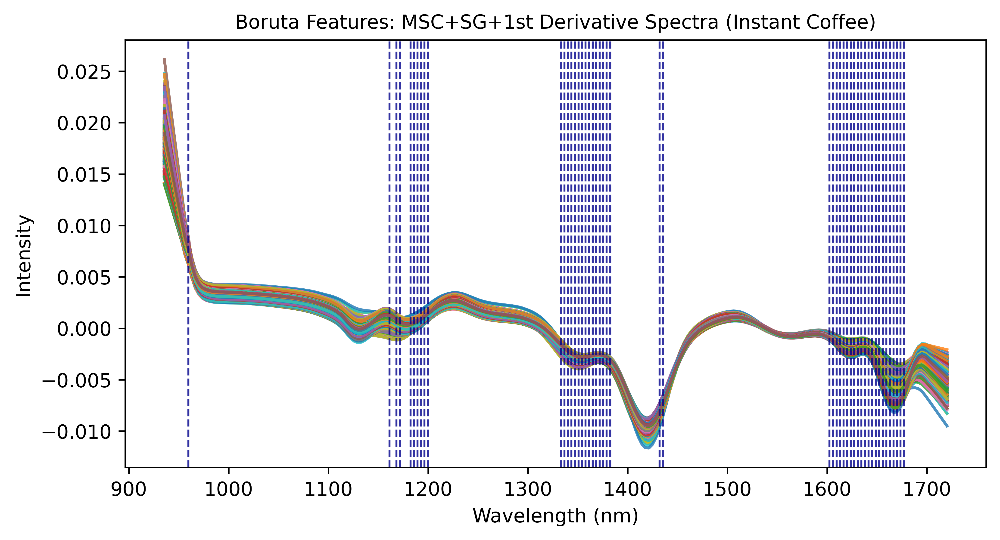

In [37]:
# Get the wavelengths from the column names
wavelengths = X_msc_sg_1d.columns.astype(float)

# Define the selected important wavelengths (replace with your actual selected features)
selected_wavelengths = selected_wavelengths_msc_sg_1d

# Plot the spectral data
plt.figure(figsize=(8, 4), dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: MSC+SG+1st Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_MSC_SG_1D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+2nd derivative

In [39]:
selected_wavelengths = [
    "X1004.830017", "X1008.299988", "X1011.77002", "X1015.23999", "X1018.710022",
    "X1022.179993", "X1025.650024", "X1029.119995", "X1032.589966", "X1056.900024",
    "X1060.380005", "X1088.199951", "X1091.680054", "X1098.650024", "X1102.130005",
    "X1105.609985", "X1109.099976", "X1112.579956", "X1116.069946", "X1119.550049",
    "X1133.5", "X1136.98999", "X1140.469971", "X1143.959961", "X1147.449951",
    "X1150.939941", "X1154.430054", "X1157.930054", "X1161.420044", "X1164.910034",
    "X1168.400024", "X1171.900024", "X1175.390015", "X1196.369995", "X1199.869995",
    "X1203.369995", "X1206.869995", "X1210.369995", "X1287.51001", "X1291.02002",
    "X1294.530029", "X1298.050049", "X1301.560059", "X1305.079956", "X1308.589966",
    "X1312.109985", "X1315.619995", "X1319.140015", "X1322.660034", "X1326.180054",
    "X1329.699951", "X1361.390015", "X1453.219971", "X1541.869995", "X1595.22998",
    "X1598.790039", "X1602.349976", "X1605.920044", "X1609.47998", "X1613.040039",
    "X1616.609985", "X1620.170044", "X1623.73999", "X1627.310059", "X1630.869995",
    "X1634.439941", "X1638.01001", "X1641.579956", "X1645.150024", "X1648.709961",
    "X1652.290039", "X1655.859985", "X1659.430054", "X1698.75", "X1702.329956",
    "X1705.910034", "X1709.48999", "X1713.069946", "X1716.650024", "X1720.22998"
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_msc_sg_2d = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_msc_sg_2d)

[1004.830017, 1008.299988, 1011.77002, 1015.23999, 1018.710022, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1056.900024, 1060.380005, 1088.199951, 1091.680054, 1098.650024, 1102.130005, 1105.609985, 1109.099976, 1112.579956, 1116.069946, 1119.550049, 1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951, 1150.939941, 1154.430054, 1157.930054, 1161.420044, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1196.369995, 1199.869995, 1203.369995, 1206.869995, 1210.369995, 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1301.560059, 1305.079956, 1308.589966, 1312.109985, 1315.619995, 1319.140015, 1322.660034, 1326.180054, 1329.699951, 1361.390015, 1453.219971, 1541.869995, 1595.22998, 1598.790039, 1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1698.75, 1702.329956, 1705.910034, 1709.48999, 1713.069946, 1716

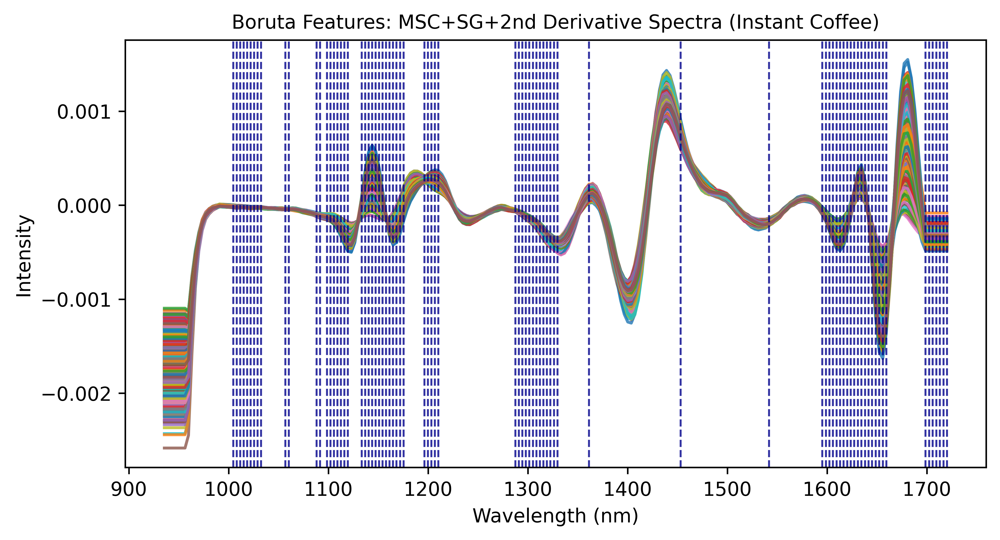

In [41]:
# Get the wavelengths from the column names
wavelengths = X_msc_sg_2d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_msc_sg_2d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: MSC+SG+2nd Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_MSC_SG_2D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+1st Derivative

In [53]:
selected_wavelengths =[
    1168.400024, 1171.900024, 1182.380005, 1185.880005, 1189.369995,
    1192.869995, 1196.369995, 1333.219971, 1336.73999, 1340.26001,
    1343.780029, 1347.300049, 1350.819946, 1354.349976, 1357.869995,
    1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5,
    1379.02002, 1602.349976, 1605.920044, 1609.47998, 1613.040039,
    1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995,
    1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961,
    1652.290039, 1655.859985, 1659.430054, 1663.0, 1666.569946,
    1670.140015, 1673.719971
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_snv_sg_1d = selected_wavelengths

# Print result
print(selected_wavelengths_snv_sg_1d)

[1168.400024, 1171.900024, 1182.380005, 1185.880005, 1189.369995, 1192.869995, 1196.369995, 1333.219971, 1336.73999, 1340.26001, 1343.780029, 1347.300049, 1350.819946, 1354.349976, 1357.869995, 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5, 1379.02002, 1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1663.0, 1666.569946, 1670.140015, 1673.719971]


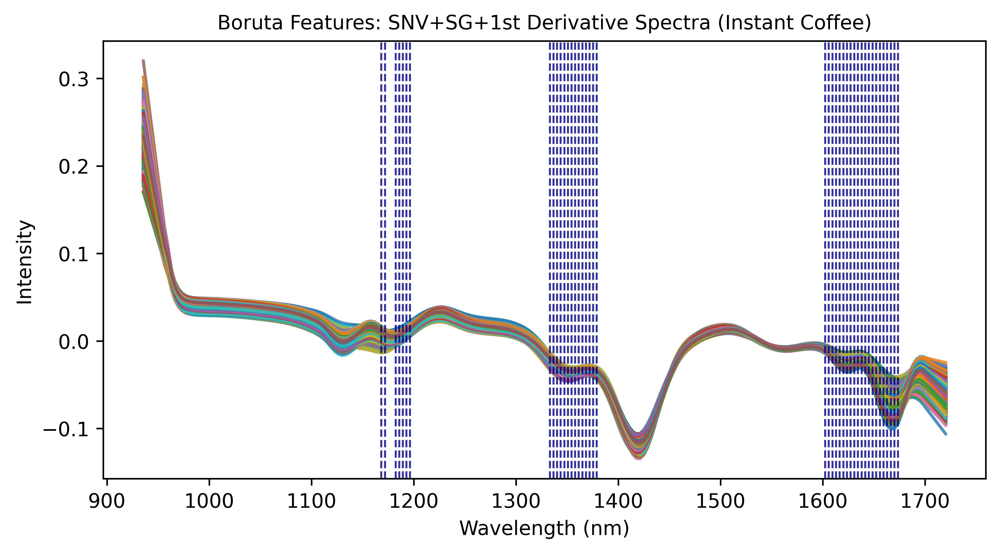

In [55]:
# Get the wavelengths from the column names
wavelengths = X_snv_sg_1d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_snv_sg_1d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: SNV+SG+1st Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_snv_SG_1D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+2nd Derivative

In [57]:
selected_wavelengths =[
    1004.830017, 1008.299988, 1011.77002, 1015.23999, 1018.710022,
    1022.179993, 1025.650024, 1029.119995, 1032.589966, 1056.900024,
    1060.380005, 1088.199951, 1091.680054, 1102.130005, 1105.609985,
    1109.099976, 1112.579956, 1116.069946, 1119.550049, 1130.01001,
    1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951,
    1150.939941, 1154.430054, 1157.930054, 1161.420044, 1164.910034,
    1168.400024, 1171.900024, 1175.390015, 1192.869995, 1196.369995,
    1199.869995, 1203.369995, 1206.869995, 1210.369995, 1287.51001,
    1291.02002, 1294.530029, 1298.050049, 1301.560059, 1305.079956,
    1308.589966, 1312.109985, 1315.619995, 1319.140015, 1322.660034,
    1326.180054, 1329.699951, 1333.219971, 1361.390015, 1364.920044,
    1449.680054, 1453.219971, 1541.869995, 1595.22998, 1598.790039,
    1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985,
    1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941,
    1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039,
    1655.859985, 1659.430054, 1698.75, 1702.329956, 1705.910034,
    1709.48999, 1713.069946, 1716.650024, 1720.22998
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_snv_sg_2d = selected_wavelengths

# Print result
print(selected_wavelengths_snv_sg_2d)

[1004.830017, 1008.299988, 1011.77002, 1015.23999, 1018.710022, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1056.900024, 1060.380005, 1088.199951, 1091.680054, 1102.130005, 1105.609985, 1109.099976, 1112.579956, 1116.069946, 1119.550049, 1130.01001, 1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951, 1150.939941, 1154.430054, 1157.930054, 1161.420044, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1192.869995, 1196.369995, 1199.869995, 1203.369995, 1206.869995, 1210.369995, 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1301.560059, 1305.079956, 1308.589966, 1312.109985, 1315.619995, 1319.140015, 1322.660034, 1326.180054, 1329.699951, 1333.219971, 1361.390015, 1364.920044, 1449.680054, 1453.219971, 1541.869995, 1595.22998, 1598.790039, 1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1698.75, 1702

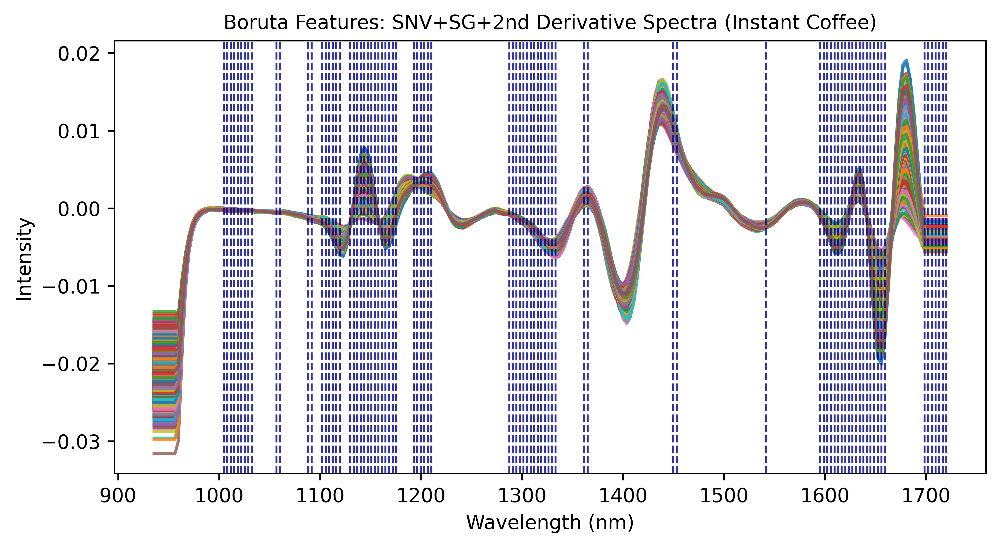

In [59]:
# Get the wavelengths from the column names
wavelengths = X_snv_sg_2d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_snv_sg_2d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='darkblue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: SNV+SG+2nd Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_SNV_SG_2D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### Wavelengths Selected by Genetic Algorithm

#### Raw Spectra

In [61]:
selected_wavelengths = [
    935.609985, 945.97998, 966.72998, 970.190002, 973.650024,
    977.109985, 1018.710022, 1022.179993, 1025.650024, 1029.119995,
    1032.589966, 1046.47998, 1056.900024, 1060.380005, 1063.849976,
    1070.810059, 1081.23999, 1088.199951, 1098.650024, 1112.579956,
    1116.069946, 1119.550049, 1123.040039, 1136.98999, 1140.469971,
    1143.959961, 1157.930054, 1164.910034, 1178.890015, 1182.380005,
    1189.369995, 1196.369995, 1199.869995, 1210.369995, 1213.869995,
    1220.869995, 1224.369995, 1234.880005, 1238.390015, 1241.890015,
    1245.400024, 1252.410034, 1262.930054, 1266.439941, 1273.459961,
    1283.98999, 1291.02002, 1298.050049, 1301.560059, 1305.079956,
    1312.109985, 1329.699951, 1333.219971, 1336.73999, 1343.780029,
    1350.819946, 1354.349976, 1361.390015, 1368.439941, 1371.969971,
    1379.02002, 1386.079956, 1393.140015, 1403.72998, 1410.790039,
    1414.319946, 1417.859985, 1421.390015, 1428.459961, 1435.530029,
    1439.069946, 1442.599976, 1453.219971, 1456.76001, 1460.300049,
    1463.839966, 1478.01001, 1481.550049, 1488.640015, 1492.180054,
    1495.72998, 1499.27002, 1517.01001, 1531.209961, 1534.76001,
    1538.319946, 1541.869995, 1548.97998, 1552.530029, 1563.199951,
    1566.75, 1573.869995, 1577.430054, 1591.670044, 1598.790039,
    1602.349976, 1609.47998, 1620.170044, 1627.310059, 1630.869995,
    1634.439941, 1638.01001, 1641.579956, 1645.150024, 1655.859985,
    1659.430054, 1666.569946, 1673.719971, 1677.290039, 1680.869995,
    1688.02002, 1695.170044, 1702.329956, 1713.069946, 1716.650024,
    1720.22998]

print(selected_wavelengths)

[935.609985, 945.97998, 966.72998, 970.190002, 973.650024, 977.109985, 1018.710022, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1046.47998, 1056.900024, 1060.380005, 1063.849976, 1070.810059, 1081.23999, 1088.199951, 1098.650024, 1112.579956, 1116.069946, 1119.550049, 1123.040039, 1136.98999, 1140.469971, 1143.959961, 1157.930054, 1164.910034, 1178.890015, 1182.380005, 1189.369995, 1196.369995, 1199.869995, 1210.369995, 1213.869995, 1220.869995, 1224.369995, 1234.880005, 1238.390015, 1241.890015, 1245.400024, 1252.410034, 1262.930054, 1266.439941, 1273.459961, 1283.98999, 1291.02002, 1298.050049, 1301.560059, 1305.079956, 1312.109985, 1329.699951, 1333.219971, 1336.73999, 1343.780029, 1350.819946, 1354.349976, 1361.390015, 1368.439941, 1371.969971, 1379.02002, 1386.079956, 1393.140015, 1403.72998, 1410.790039, 1414.319946, 1417.859985, 1421.390015, 1428.459961, 1435.530029, 1439.069946, 1442.599976, 1453.219971, 1456.76001, 1460.300049, 1463.839966, 1478.01001, 1481.550049, 148

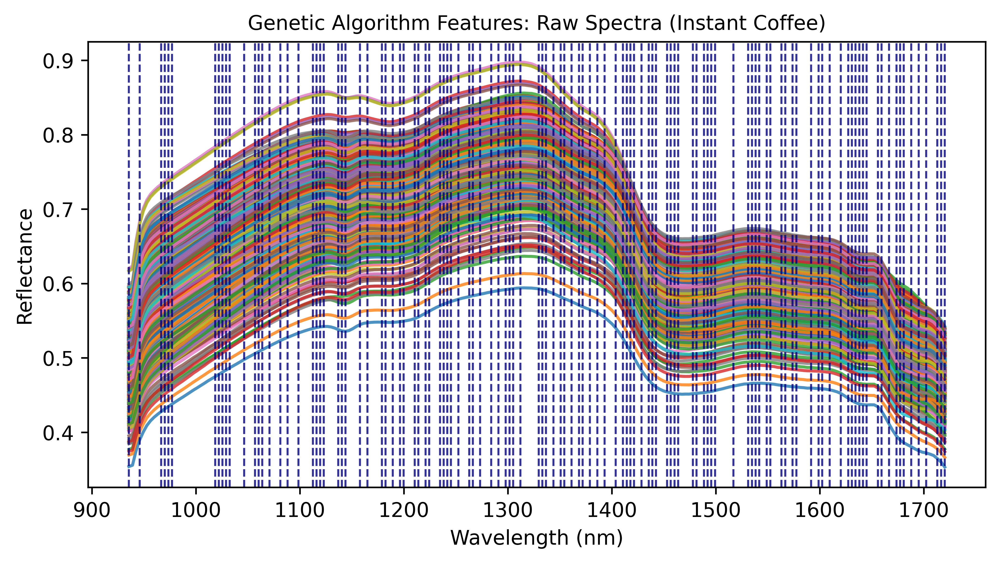

In [89]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_raw.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='navy', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: Raw Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Reflectance', fontsize=10)
plt.grid(False)
plt.savefig("GA_Raw_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+first derivative

In [91]:
selected_wavelengths = [
    939.059998, 949.429993, 952.890015, 959.809998, 963.27002,
    966.72998, 980.580017, 987.51001, 1015.23999, 1022.179993,
    1025.650024, 1029.119995, 1032.589966, 1036.060059, 1043.0,
    1046.47998, 1049.949951, 1074.290039, 1081.23999, 1084.719971,
    1088.199951, 1095.170044, 1098.650024, 1102.130005, 1105.609985,
    1109.099976, 1116.069946, 1119.550049, 1126.52002, 1130.01001,
    1136.98999, 1143.959961, 1147.449951, 1154.430054, 1157.930054,
    1161.420044, 1175.390015, 1178.890015, 1182.380005, 1185.880005,
    1189.369995, 1196.369995, 1206.869995, 1220.869995, 1227.869995,
    1231.380005, 1238.390015, 1241.890015, 1245.400024, 1248.900024,
    1252.410034, 1255.920044, 1262.930054, 1269.949951, 1273.459961,
    1283.98999, 1287.51001, 1291.02002, 1294.530029, 1298.050049,
    1301.560059, 1315.619995, 1326.180054, 1333.219971, 1343.780029,
    1347.300049, 1350.819946, 1354.349976, 1357.869995, 1364.920044,
    1371.969971, 1375.5, 1382.550049, 1386.079956, 1389.609985,
    1393.140015, 1403.72998, 1410.790039, 1421.390015, 1424.920044,
    1428.459961, 1431.98999, 1439.069946, 1449.680054, 1453.219971,
    1456.76001, 1460.300049, 1463.839966, 1467.380005, 1470.920044,
    1481.550049, 1485.089966, 1488.640015, 1513.459961, 1517.01001,
    1538.319946, 1545.420044, 1548.97998, 1552.530029, 1556.089966,
    1559.640015, 1563.199951, 1580.98999, 1588.109985, 1591.670044,
    1598.790039, 1602.349976, 1605.920044, 1616.609985, 1620.170044,
    1623.73999, 1627.310059, 1630.869995, 1659.430054, 1680.869995,
    1691.589966, 1705.910034, 1709.48999, 1713.069946, 1720.229984]

print(selected_wavelengths)

[939.059998, 949.429993, 952.890015, 959.809998, 963.27002, 966.72998, 980.580017, 987.51001, 1015.23999, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1043.0, 1046.47998, 1049.949951, 1074.290039, 1081.23999, 1084.719971, 1088.199951, 1095.170044, 1098.650024, 1102.130005, 1105.609985, 1109.099976, 1116.069946, 1119.550049, 1126.52002, 1130.01001, 1136.98999, 1143.959961, 1147.449951, 1154.430054, 1157.930054, 1161.420044, 1175.390015, 1178.890015, 1182.380005, 1185.880005, 1189.369995, 1196.369995, 1206.869995, 1220.869995, 1227.869995, 1231.380005, 1238.390015, 1241.890015, 1245.400024, 1248.900024, 1252.410034, 1255.920044, 1262.930054, 1269.949951, 1273.459961, 1283.98999, 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1301.560059, 1315.619995, 1326.180054, 1333.219971, 1343.780029, 1347.300049, 1350.819946, 1354.349976, 1357.869995, 1364.920044, 1371.969971, 1375.5, 1382.550049, 1386.079956, 1389.609985, 1393.140015, 1403.72998, 1410.790039, 1421.390015, 142

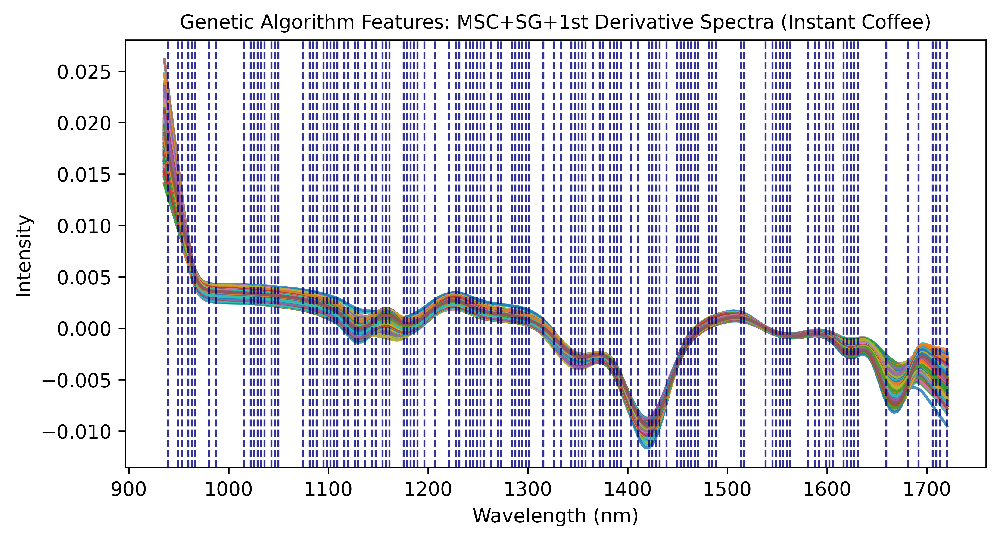

In [93]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='navy', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: MSC+SG+1st Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_MSC+SG+1D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+second derivative

In [95]:
selected_wavelengths = [935.609985, 959.809998, 963.27002, 966.72998, 970.190002,
    977.109985, 984.039978, 990.969971, 994.429993, 1001.369995,
    1004.830017, 1008.299988, 1025.650024, 1029.119995, 1032.589966,
    1039.530029, 1043.0, 1049.949951, 1056.900024, 1063.849976,
    1074.290039, 1077.76001, 1081.23999, 1084.719971, 1088.199951,
    1098.650024, 1102.130005, 1109.099976, 1126.52002, 1136.98999,
    1147.449951, 1154.430054, 1157.930054, 1161.420044, 1168.400024,
    1171.900024, 1185.880005, 1189.369995, 1196.369995, 1203.369995,
    1217.369995, 1224.369995, 1231.380005, 1234.880005, 1241.890015,
    1266.439941, 1283.98999, 1291.02002, 1294.530029, 1308.589966,
    1315.619995, 1319.140015, 1340.26001, 1347.300049, 1361.390015,
    1364.920044, 1368.439941, 1371.969971, 1375.5, 1382.550049,
    1396.670044, 1400.199951, 1407.26001, 1414.319946, 1424.920044,
    1428.459961, 1435.530029, 1439.069946, 1442.599976, 1449.680054,
    1467.380005, 1470.920044, 1478.01001, 1485.089966, 1488.640015,
    1492.180054, 1495.72998, 1499.27002, 1513.459961, 1517.01001,
    1520.560059, 1531.209961, 1534.76001, 1545.420044, 1570.310059,
    1580.98999, 1588.109985, 1595.22998, 1605.920044, 1609.47998,
    1616.609985, 1620.170044, 1627.310059, 1630.869995, 1634.439941,
    1638.01001, 1641.579956, 1648.709961, 1666.569946, 1670.140015,
    1688.02002, 1691.589966, 1709.48999, 1713.069946, 1720.22998]

print(selected_wavelengths)

[935.609985, 959.809998, 963.27002, 966.72998, 970.190002, 977.109985, 984.039978, 990.969971, 994.429993, 1001.369995, 1004.830017, 1008.299988, 1025.650024, 1029.119995, 1032.589966, 1039.530029, 1043.0, 1049.949951, 1056.900024, 1063.849976, 1074.290039, 1077.76001, 1081.23999, 1084.719971, 1088.199951, 1098.650024, 1102.130005, 1109.099976, 1126.52002, 1136.98999, 1147.449951, 1154.430054, 1157.930054, 1161.420044, 1168.400024, 1171.900024, 1185.880005, 1189.369995, 1196.369995, 1203.369995, 1217.369995, 1224.369995, 1231.380005, 1234.880005, 1241.890015, 1266.439941, 1283.98999, 1291.02002, 1294.530029, 1308.589966, 1315.619995, 1319.140015, 1340.26001, 1347.300049, 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5, 1382.550049, 1396.670044, 1400.199951, 1407.26001, 1414.319946, 1424.920044, 1428.459961, 1435.530029, 1439.069946, 1442.599976, 1449.680054, 1467.380005, 1470.920044, 1478.01001, 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1499.27002, 1513.459961, 1517

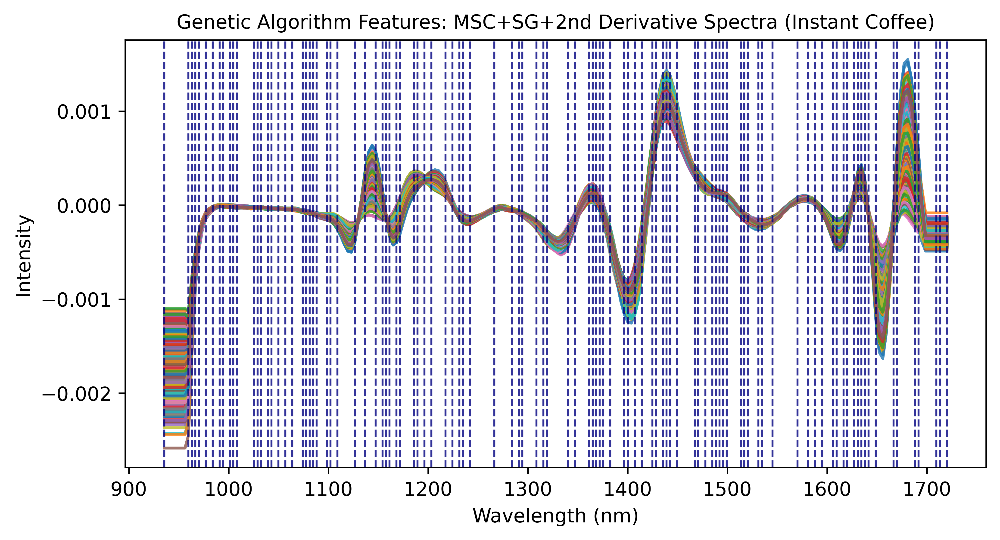

In [97]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='navy', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: MSC+SG+2nd Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_MSC+SG+2D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

In [99]:
selected_wavelengths = [935.609985, 945.97998, 949.429993, 959.809998, 966.72998,
    970.190002, 973.650024, 977.109985, 980.580017, 984.039978,
    987.51001, 990.969971, 994.429993, 997.900024, 1011.77002,
    1015.23999, 1018.710022, 1063.849976, 1070.810059, 1077.76001,
    1081.23999, 1084.719971, 1112.579956, 1123.040039, 1133.5,
    1140.469971, 1147.449951, 1154.430054, 1161.420044, 1168.400024,
    1178.890015, 1185.880005, 1203.369995, 1213.869995, 1217.369995,
    1220.869995, 1224.369995, 1227.869995, 1231.380005, 1252.410034,
    1255.920044, 1262.930054, 1269.949951, 1283.98999, 1291.02002,
    1305.079956, 1315.619995, 1319.140015, 1322.660034, 1329.699951,
    1333.219971, 1336.73999, 1343.780029, 1347.300049, 1354.349976,
    1371.969971, 1379.02002, 1386.079956, 1393.140015, 1400.199951,
    1403.72998, 1407.26001, 1424.920044, 1435.530029, 1446.140015,
    1456.76001, 1467.380005, 1470.920044, 1474.459961, 1488.640015,
    1495.72998, 1502.819946, 1517.01001, 1520.560059, 1524.109985,
    1527.660034, 1541.869995, 1545.420044, 1548.97998, 1556.089966,
    1559.640015, 1563.199951, 1577.430054, 1598.790039, 1605.920044,
    1620.170044, 1623.73999, 1634.439941, 1638.01001, 1641.579956,
    1645.150024, 1648.709961, 1659.430054, 1663.0, 1670.140015,
    1677.290039, 1688.02002, 1698.75, 1705.910034, 1709.48999,
    1713.069946]

print(selected_wavelengths)

[935.609985, 945.97998, 949.429993, 959.809998, 966.72998, 970.190002, 973.650024, 977.109985, 980.580017, 984.039978, 987.51001, 990.969971, 994.429993, 997.900024, 1011.77002, 1015.23999, 1018.710022, 1063.849976, 1070.810059, 1077.76001, 1081.23999, 1084.719971, 1112.579956, 1123.040039, 1133.5, 1140.469971, 1147.449951, 1154.430054, 1161.420044, 1168.400024, 1178.890015, 1185.880005, 1203.369995, 1213.869995, 1217.369995, 1220.869995, 1224.369995, 1227.869995, 1231.380005, 1252.410034, 1255.920044, 1262.930054, 1269.949951, 1283.98999, 1291.02002, 1305.079956, 1315.619995, 1319.140015, 1322.660034, 1329.699951, 1333.219971, 1336.73999, 1343.780029, 1347.300049, 1354.349976, 1371.969971, 1379.02002, 1386.079956, 1393.140015, 1400.199951, 1403.72998, 1407.26001, 1424.920044, 1435.530029, 1446.140015, 1456.76001, 1467.380005, 1470.920044, 1474.459961, 1488.640015, 1495.72998, 1502.819946, 1517.01001, 1520.560059, 1524.109985, 1527.660034, 1541.869995, 1545.420044, 1548.97998, 1556.089

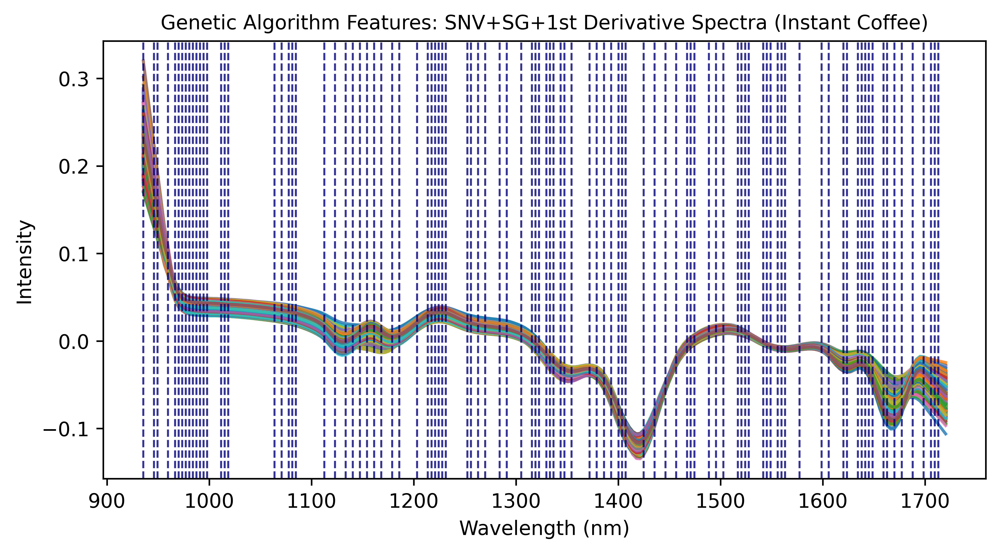

In [101]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='navy', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: SNV+SG+1st Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_SNV+SG+1D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+2nd Derivative

In [103]:
selected_wavelengths = [
    935.609985, 939.059998, 942.52002, 945.97998, 949.429993,
    952.890015, 970.190002, 973.650024, 984.039978, 987.51001,
    990.969971, 994.429993, 1004.830017, 1008.299988, 1011.77002,
    1015.23999, 1032.589966, 1036.060059, 1039.530029, 1043.0,
    1046.47998, 1049.949951, 1053.430054, 1056.900024, 1060.380005,
    1063.849976, 1102.130005, 1105.609985, 1116.069946, 1119.550049,
    1123.040039, 1126.52002, 1130.01001, 1133.5, 1164.910034,
    1168.400024, 1171.900024, 1175.390015, 1178.890015, 1182.380005,
    1192.869995, 1196.369995, 1220.869995, 1224.369995, 1227.869995,
    1231.380005, 1234.880005, 1238.390015, 1241.890015, 1245.400024,
    1248.900024, 1252.410034, 1255.920044, 1259.420044, 1262.930054,
    1266.439941, 1269.949951, 1273.459961, 1291.02002, 1294.530029,
    1298.050049, 1301.560059, 1319.140015, 1322.660034, 1326.180054,
    1329.699951, 1333.219971, 1336.73999, 1361.390015, 1364.920044,
    1382.550049, 1386.079956, 1389.609985, 1393.140015, 1400.199951,
    1417.859985, 1421.390015, 1424.920044, 1428.459961, 1431.98999,
    1435.530029, 1439.069946, 1442.599976, 1446.140015, 1449.680054,
    1453.219971, 1456.76001, 1460.300049, 1463.839966, 1474.459961,
    1478.01001, 1481.550049, 1485.089966, 1538.319946, 1541.869995,
    1552.530029, 1556.089966, 1559.640015, 1563.199951, 1566.75,
    1570.310059, 1595.22998, 1623.73999, 1630.869995, 1638.01001,
    1645.150024, 1652.290039, 1655.859985, 1663.0, 1677.290039,
    1680.869995, 1695.170044, 1698.75, 1705.910034]

print(selected_wavelengths)

[935.609985, 939.059998, 942.52002, 945.97998, 949.429993, 952.890015, 970.190002, 973.650024, 984.039978, 987.51001, 990.969971, 994.429993, 1004.830017, 1008.299988, 1011.77002, 1015.23999, 1032.589966, 1036.060059, 1039.530029, 1043.0, 1046.47998, 1049.949951, 1053.430054, 1056.900024, 1060.380005, 1063.849976, 1102.130005, 1105.609985, 1116.069946, 1119.550049, 1123.040039, 1126.52002, 1130.01001, 1133.5, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1182.380005, 1192.869995, 1196.369995, 1220.869995, 1224.369995, 1227.869995, 1231.380005, 1234.880005, 1238.390015, 1241.890015, 1245.400024, 1248.900024, 1252.410034, 1255.920044, 1259.420044, 1262.930054, 1266.439941, 1269.949951, 1273.459961, 1291.02002, 1294.530029, 1298.050049, 1301.560059, 1319.140015, 1322.660034, 1326.180054, 1329.699951, 1333.219971, 1336.73999, 1361.390015, 1364.920044, 1382.550049, 1386.079956, 1389.609985, 1393.140015, 1400.199951, 1417.859985, 1421.390015, 1424.920044, 1428.459961, 1431

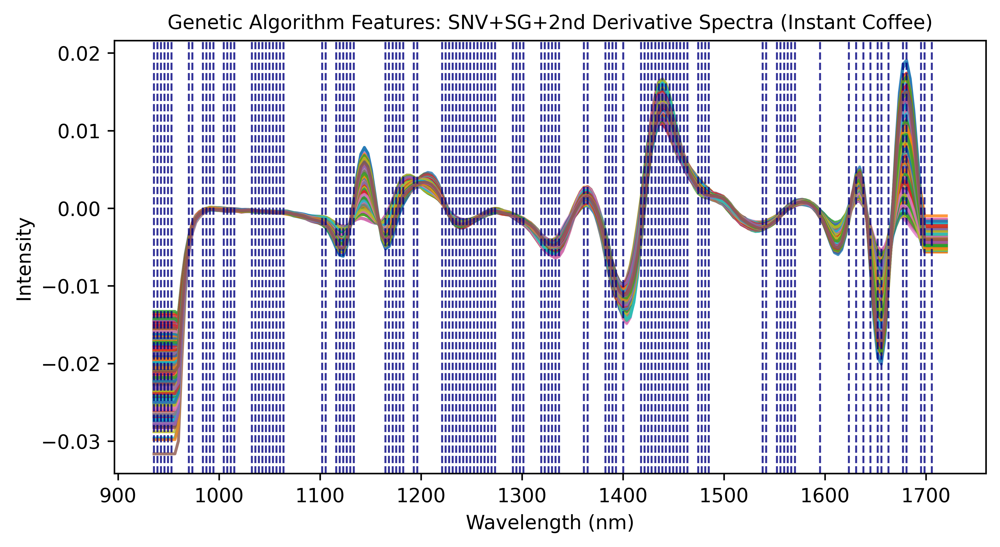

In [105]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='navy', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")
# Add title and labels
plt.title('Genetic Algorithm Features: SNV+SG+2nd Derivative Spectra (Instant Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_SNV+SG+2D_instant_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()